<a href="https://colab.research.google.com/github/lk-learner/AMII-Machine-Learning-Technician-1/blob/main/PA2_practice_NASA_turbofan_jet_engine_dataset1_practice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# AMII - Machine Learning Technician 1
## PA 2: DECISION TREES
Due Date: Friday, November 6, 2020, 5pm

## Fall 2020 - Team 2


Dataset selected: 

### NASA Turbofan Jet Engine Data Set: Run to Failure Degradation Simulation
https://www.kaggle.com/behrad3d/nasa-cmaps





# **3. Problem Scoping: Backward Process**

</br>
<font color ='blue'>3a) Describe the outcome(s) you hope to achieve. List all outcomes, narrow the list, then aim for one. Keep track of the initial brainstorm as this may serve you as you iterate on your problem scoping.
 





1. Eliminate plane crashes due to engine failures.
**2. Maximize the operating lifetime of the engine.**
3. Determine when the engine is not optimally operating.
4. Determine if a fault is system critical or can be addressed later
5. Determine number of cycles before failure occurs

</br>
<font color ='blue'>
3b) Approximate the performance, time and cost of how this task might currently be done at a company. Remember, this is a back of the napkin calculation.

Traditional Sensor analysis by a engineering specialist to calculate the outcome (Tedious and lengthly for a person process all of this data, Performance would be subjective based on the personnel doing the analysis, may not be very repeatable, cost of a person or team to do the analysis)

Use actual engines to run to failure to collect actual data instead of simulation data. This is a similar performance and time as above but added cost of losing a working engine. Predictive performance would be better than simulation data using this method.

As for clarification on back-of-napkin calculation details?

</br>
<font color ='blue'>3c) Identify which of the 5 Value Areas (Prevent, Project, Produce, Promote,
Personalize) your outcome is related to.



Prevention:
  All of our outcomes could be considered a prevention value area as we are preventing failure in system critical components.

  Outcome 3 and 5 fall under the Project Value Area as they are not actively preventing an undesirable outcome as they classify the state of the engine.

1. Do preventative maintenance / plan inspection on the engine to extend the life.

2. Re-Prioritize maintenance schedule based on remaining life.

3. Extend the life of the engine or retire.

</br>
<font color ='blue'>3d) Describe the potential actions that will be performed to produce your outcome.


Potentinal Actions:

Compare cost of maintaining or repair vs replace.

Estimate the remaining life of the engine




</br>
<font color ='blue'>3e) Do a judgement analysis of when your QuAM produces a right and a wrong answer. List the potential consequences and potential corrective actions.



Risks:
False Positives - The engine fails before the remaining life predicted by the QuAM. This results is significant costs to equipment, reputation, and safety. Corrective action by retraining the QuAM on the new data from the engine failure.

</br>
<font color ='blue'>3f) List the question your QuAM will answer by specifying both the question template and question object. Verify that this aligns with your business outcome.


Question Template: Should the ____ be replaced?

Question Object: Engine

Question: Should the engine be replaced?


</br>
<font color ='blue'>3g) List the answers you expect your QuAM to produce. Verify that they align with the business outcome.

QuAM might produce following answers:

Yes, the engine should be replaced

No, continue to run as per maintenance schedule.



# **4. Problem Scoping: Forward Process**


</br>
<font color ='blue'>4a) Get to know your dataset!

i. See Data Inspection section below.</br>
ii. See Data Analysis section below.</br>


</br>
<font color ='blue'>4b) Verify (and update, if needed) that the question template, question object, and answer that you were expecting to generate are still feasible.


The question template, object, and answer are still feasible because we have the time to failure and RUL for each engine in the training data.

</br>
<font color ='blue'>4c) Verify (and update, if needed) that the judgment assessment you made for correct and incorrect answers are still complete.


The judgement is still valid and we can penalize false positives more than false negatives to build confidence in the QuAM and prevent disasters

</br>
<font color ='blue'>4d) Verify (an update, if needed) that the actions you listed still match your answers.


Comparing the cost of repairing the engine vs replacing the engine was not included in the data set, so it cannot inferred. So the actions of comparing the cost of each choice is no longer valid.

However, the RUL is calculated from the data and can be used as a metric in the answer provided by the QuAM.

</br>
<font color ='blue'>4e) Verify (and update, if needed) that the business outcome you’re hoping to achieve aligns with your data and updated question, answer, judgement and actions.

The business outcome was to minimze costs by maximizing the lifetime of the engines. This is directly influenced by the output of the QuAM. 

# **Data Inspection**

After looking at the provided training data and test data, we observed that test data has the same features as the training data. However, the test data does not include time to cycles all the way to failure because the simulations were stopped prior to that time. The actual RUL values are provided seperately in the RUL files.

The columns in the raw data have no headers but the included paper describing the data set provide a list of variables, listed below. The readme file in the data set did not specify the order of the sensors so it was assumed that it is the same order as the table below.

| Symbol | Description | Units |
| :-: | :- | :-: |
| Unit No. | Engine identification number | -- |
| Time in Cycles | Number of engine operating cycles | -- |
| Operation Setting 1 | Altitude | 0-42 ft |
| Operation Setting 2 | Mach Number | 0-0.84 |
| Operation Setting 3 | Throttle resolver angle | degrees |
| T2 | Total temperature at fan inlet | °R
| T24 | Total temperature at LPC outlet | °R |
| T30 | Total temperature at HPC outlet | °R |
| T50 | Total temperature at LPT outlet | °R |
| P2 | Pressure at fan inlet | psia |
| P15 | Total pressure in bypass-duct | psia |
| P30 | Total pressure at HPC outlet | psia |
| Nf | Physical fan speed | rpm |
| Nc | Physical core speed | rpm |
| epr | Engine pressure ratio (P50/P2) | -- | 
| Ps30 | Static pressure at HPC outlet | psia |
| phi | Ratio of fuel flow to Ps30 | pps/psi |
| NRf | Corrected fan speed | rpm |
| NRc | Corrected core speed | rpm |
| BPR | Bypass Ratio | -- |
| farB | Burner fuel-air ratio | -- |
| htBleed | Bleed Enthalpy  | -- | 
| Nf_dmd | Demanded fan speed | rpm |
| PCNfR_dmd | Demanded corrected fan speed | rpm |
| W31 | HPT coolant bleed | lbm/s |
| W32 | LPT coolant bleed | lbm/s |

### **Loading Library**

In [ ]:
import numpy as np
import pandas as pd
import plotly.express as px
import graphviz

from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

### **Loading Data from google drive**

In [ ]:
FD1_df=pd.read_csv('/content/drive/My Drive/archive/CMaps/train_FD001.txt',sep=' ', index_col=False, names=['Unit Number','Time in cycles','Operational setting 1(Altitude)','Operational setting 2(Mach number)','Operational setting 3(TRA)','Sensor measurement 1(T2)',
                                                                                                            'Sensor measurement 2(T24)','Sensor measurement 3(T30)','Sensor measurement 4(T50)','Sensor measurement 5(P2)','Sensor measurement 6(P15)',
                                                                                                            'Sensor measurement 7(P30)','Sensor measurement 8(Nf)','Sensor measurement 9(Nc)','Sensor measurement 10(epr)','Sensor measurement 11(Ps30)',
                                                                                                            'Sensor measurement 12(Phi)','Sensor measurement 13(NRf)','Sensor measurement 14(NRc)','Sensor measurement 15(BPR)','Sensor measurement 16(farB)',
                                                                                                            'Sensor measurement 17(htBleed)','Sensor measurement 18(Nf_dmd)','Sensor measurement 19(PCNfR_dmd)','Sensor measurement 20(W31)','Sensor measurement 21(W32)',
                                                                                                            'Sensor measurement 22','Sensor measurement 23','Sensor measurement 24','Sensor measurement 25','Sensor measurement 26',])


### **Checking for Missing values, Duplicate data, Misalignment of values and columns**


In [ ]:
FD1_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Data columns (total 31 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Unit Number                         20631 non-null  int64  
 1   Time in cycles                      20631 non-null  int64  
 2   Operational setting 1(Altitude)     20631 non-null  float64
 3   Operational setting 2(Mach number)  20631 non-null  float64
 4   Operational setting 3(TRA)          20631 non-null  float64
 5   Sensor measurement 1(T2)            20631 non-null  float64
 6   Sensor measurement 2(T24)           20631 non-null  float64
 7   Sensor measurement 3(T30)           20631 non-null  float64
 8   Sensor measurement 4(T50)           20631 non-null  float64
 9   Sensor measurement 5(P2)            20631 non-null  float64
 10  Sensor measurement 6(P15)           20631 non-null  float64
 11  Sensor measurement 7(P30)           20631

In [ ]:
#Missing values
FD1_df.isna().sum()

Unit Number                               0
Time in cycles                            0
Operational setting 1(Altitude)           0
Operational setting 2(Mach number)        0
Operational setting 3(TRA)                0
Sensor measurement 1(T2)                  0
Sensor measurement 2(T24)                 0
Sensor measurement 3(T30)                 0
Sensor measurement 4(T50)                 0
Sensor measurement 5(P2)                  0
Sensor measurement 6(P15)                 0
Sensor measurement 7(P30)                 0
Sensor measurement 8(Nf)                  0
Sensor measurement 9(Nc)                  0
Sensor measurement 10(epr)                0
Sensor measurement 11(Ps30)               0
Sensor measurement 12(Phi)                0
Sensor measurement 13(NRf)                0
Sensor measurement 14(NRc)                0
Sensor measurement 15(BPR)                0
Sensor measurement 16(farB)               0
Sensor measurement 17(htBleed)            0
Sensor measurement 18(Nf_dmd)   

Sensor measurement 22-26 have NaN values which means we can drop these features in Data cleaning stage of the project

In [ ]:
#Duplicate data
FD1_df.duplicated().sum()

0

### **Statistical Analysis of data**

In [ ]:
FD1_df.describe()

,Unit Number,Time in cycles,Operational setting 1(Altitude),Operational setting 2(Mach number),Operational setting 3(TRA),Sensor measurement 1(T2),Sensor measurement 2(T24),Sensor measurement 3(T30),Sensor measurement 4(T50),Sensor measurement 5(P2),Sensor measurement 6(P15),Sensor measurement 7(P30),Sensor measurement 8(Nf),Sensor measurement 9(Nc),Sensor measurement 10(epr),Sensor measurement 11(Ps30),Sensor measurement 12(Phi),Sensor measurement 13(NRf),Sensor measurement 14(NRc),Sensor measurement 15(BPR),Sensor measurement 16(farB),Sensor measurement 17(htBleed),Sensor measurement 18(Nf_dmd),Sensor measurement 19(PCNfR_dmd),Sensor measurement 20(W31),Sensor measurement 21(W32),Sensor measurement 22,Sensor measurement 23,Sensor measurement 24,Sensor measurement 25,Sensor measurement 26
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,2.063100e+04,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.0,20631.0,20631.000000,20631.000000,0.0,0.0,0.0,0.0,0.0
mean,51.506568,108.807862,-0.000009,0.000002,100.0,5.186700e+02,642.680934,1590.523119,1408.933782,1.462000e+01,21.609803,553.367711,2388.096652,9065.242941,1.300000e+00,47.541168,521.413470,2388.096152,8143.752722,8.442146,3.000000e-02,393.210654,2388.0,100.0,38.816271,23.289705,NaN,NaN,NaN,NaN,NaN
std,29.227633,68.880990,0.002187,0.000293,0.0,6.537152e-11,0.500053,6.131150,9.000605,3.394700e-12,0.001389,0.885092,0.070985,22.082880,4.660829e-13,0.267087,0.737553,0.071919,19.076176,0.037505,1.556432e-14,1.548763,0.0,0.0,0.180746,0.108251,NaN,NaN,NaN,NaN,NaN
min,1.000000,1.000000,-0.008700,-0.000600,100.0,5.186700e+02,641.210000,1571.040000,1382.250000,1.462000e+01,21.600000,549.850000,2387.900000,9021.730000,1.300000e+00,46.850000,518.690000,2387.880000,8099.940000,8.324900,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200,NaN,NaN,NaN,NaN,NaN
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,5.186700e+02,642.325000,1586.260000,1402.360000,1.462000e+01,21.610000,552.810000,2388.050000,9053.100000,1.300000e+00,47.350000,520.960000,2388.040000,8133.245000,8.414900,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800,NaN,NaN,NaN,NaN,NaN
50%,52.000000,104.000000,0.000000,0.000000,100.0,5.186700e+02,642.640000,1590.100000,1408.040000,1.462000e+01,21.610000,553.440000,2388.090000,9060.660000,1.300000e+00,47.510000,521.480000,2388.090000,8140.540000,8.438900,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900,NaN,NaN,NaN,NaN,NaN
75%,77.000000,156.000000,0.001500,0.000300,100.0,5.186700e+02,643.000000,1594.380000,1414.555000,1.462000e+01,21.610000,554.010000,2388.140000,9069.420000,1.300000e+00,47.700000,521.950000,2388.140000,8148.310000,8.465600,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800,NaN,NaN,NaN,NaN,NaN
max,100.000000,362.000000,0.008700,0.000600,100.0,5.186700e+02,644.530000,1616.910000,1441.490000,1.462000e+01,21.610000,556.060000,2388.560000,9244.590000,1.300000e+00,48.530000,523.380000,2388.560000,8293.720000,8.584800,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400,NaN,NaN,NaN,NaN,NaN


Missing Values: No data in Sensor 22-26 so we can remove these columns

In [ ]:
FD1_df.dropna(how='all', axis='columns', inplace=True)

Since we want to determine when to replace the engine, we want to know the remaining useful life (RUL) for each engine unit throughout the entire life of the engine. However, this data is not presented as a feature in the training data.

The research paper details that each engine unit in the training data was simulated to failure, defined as the health index reaching a value of 0. This means that the maximum time_in_cycles for each unit corresponds to the simulated end of life for that engine. We will gather this information out of the data set and create a new feature called Time to Failure in the training data. We can then calculate a RUL value for each engine unit in each cycle.

In [ ]:
#Add a new column for the Time to Failure and RUL values
FD1_df['Time_to_Failure'] = 0

#Group data by unit number and grab the maximum cycles for each unit as an array
trainingt_t2f = FD1_df.groupby(['Unit Number']).max()['Time in cycles'].to_numpy()

#Loop throught the t2f array and assign the value to the Time to Failure column for each unit
for unit, t2f in enumerate(trainingt_t2f, start=1):
  is_unit = (FD1_df['Unit Number'] == unit)
  FD1_df.loc[is_unit, 'Time_to_Failure'] = t2f

#Calculate the RUL by taking the difference between Time to Failure and RUL
FD1_df['RUL'] = FD1_df['Time_to_Failure'] - FD1_df['Time in cycles']

In [ ]:
FD1_df.describe()

,Unit Number,Time in cycles,Operational setting 1(Altitude),Operational setting 2(Mach number),Operational setting 3(TRA),Sensor measurement 1(T2),Sensor measurement 2(T24),Sensor measurement 3(T30),Sensor measurement 4(T50),Sensor measurement 5(P2),Sensor measurement 6(P15),Sensor measurement 7(P30),Sensor measurement 8(Nf),Sensor measurement 9(Nc),Sensor measurement 10(epr),Sensor measurement 11(Ps30),Sensor measurement 12(Phi),Sensor measurement 13(NRf),Sensor measurement 14(NRc),Sensor measurement 15(BPR),Sensor measurement 16(farB),Sensor measurement 17(htBleed),Sensor measurement 18(Nf_dmd),Sensor measurement 19(PCNfR_dmd),Sensor measurement 20(W31),Sensor measurement 21(W32),Time_to_Failure,RUL
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,2.063100e+04,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.000000,20631.000000,20631.000000,20631.000000,2.063100e+04,20631.000000,20631.0,20631.0,20631.000000,20631.000000,20631.000000,20631.000000
mean,51.506568,108.807862,-0.000009,0.000002,100.0,5.186700e+02,642.680934,1590.523119,1408.933782,1.462000e+01,21.609803,553.367711,2388.096652,9065.242941,1.300000e+00,47.541168,521.413470,2388.096152,8143.752722,8.442146,3.000000e-02,393.210654,2388.0,100.0,38.816271,23.289705,216.615724,107.807862
std,29.227633,68.880990,0.002187,0.000293,0.0,6.537152e-11,0.500053,6.131150,9.000605,3.394700e-12,0.001389,0.885092,0.070985,22.082880,4.660829e-13,0.267087,0.737553,0.071919,19.076176,0.037505,1.556432e-14,1.548763,0.0,0.0,0.180746,0.108251,50.028600,68.880990
min,1.000000,1.000000,-0.008700,-0.000600,100.0,5.186700e+02,641.210000,1571.040000,1382.250000,1.462000e+01,21.600000,549.850000,2387.900000,9021.730000,1.300000e+00,46.850000,518.690000,2387.880000,8099.940000,8.324900,3.000000e-02,388.000000,2388.0,100.0,38.140000,22.894200,128.000000,0.000000
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,5.186700e+02,642.325000,1586.260000,1402.360000,1.462000e+01,21.610000,552.810000,2388.050000,9053.100000,1.300000e+00,47.350000,520.960000,2388.040000,8133.245000,8.414900,3.000000e-02,392.000000,2388.0,100.0,38.700000,23.221800,185.000000,51.000000
50%,52.000000,104.000000,0.000000,0.000000,100.0,5.186700e+02,642.640000,1590.100000,1408.040000,1.462000e+01,21.610000,553.440000,2388.090000,9060.660000,1.300000e+00,47.510000,521.480000,2388.090000,8140.540000,8.438900,3.000000e-02,393.000000,2388.0,100.0,38.830000,23.297900,207.000000,103.000000
75%,77.000000,156.000000,0.001500,0.000300,100.0,5.186700e+02,643.000000,1594.380000,1414.555000,1.462000e+01,21.610000,554.010000,2388.140000,9069.420000,1.300000e+00,47.700000,521.950000,2388.140000,8148.310000,8.465600,3.000000e-02,394.000000,2388.0,100.0,38.950000,23.366800,240.000000,155.000000
max,100.000000,362.000000,0.008700,0.000600,100.0,5.186700e+02,644.530000,1616.910000,1441.490000,1.462000e+01,21.610000,556.060000,2388.560000,9244.590000,1.300000e+00,48.530000,523.380000,2388.560000,8293.720000,8.584800,3.000000e-02,400.000000,2388.0,100.0,39.430000,23.618400,362.000000,361.000000


In [ ]:
FD1_df

,Unit Number,Time in cycles,Operational setting 1(Altitude),Operational setting 2(Mach number),Operational setting 3(TRA),Sensor measurement 1(T2),Sensor measurement 2(T24),Sensor measurement 3(T30),Sensor measurement 4(T50),Sensor measurement 5(P2),Sensor measurement 6(P15),Sensor measurement 7(P30),Sensor measurement 8(Nf),Sensor measurement 9(Nc),Sensor measurement 10(epr),Sensor measurement 11(Ps30),Sensor measurement 12(Phi),Sensor measurement 13(NRf),Sensor measurement 14(NRc),Sensor measurement 15(BPR),Sensor measurement 16(farB),Sensor measurement 17(htBleed),Sensor measurement 18(Nf_dmd),Sensor measurement 19(PCNfR_dmd),Sensor measurement 20(W31),Sensor measurement 21(W32),Time_to_Failure,RUL
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,1.3,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,192,191
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,1.3,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,192,190
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,1.3,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,192,189
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,1.3,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,192,188
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,1.3,47.28,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,192,187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,21.61,551.43,2388.19,9065.52,1.3,48.07,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735,200,4
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,21.61,550.86,2388.23,9065.11,1.3,48.04,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594,200,3
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,21.61,550.94,2388.24,9065.90,1.3,48.09,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333,200,2
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,21.61,550.68,2388.25,9073.72,1.3,48.39,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640,200,1


# **Data Analysis**

There are no categorical features but unit number data represent information for 100 engines which could be considered as categorical.


Note: Data does not change in test and training datasets: Operation setting 3(TRA), sensor measurement 18(Nf_dmd), sensor meaasurement 19(PCNfR_dmd).

Engine-1 train dataset (Train_FD001.txt), following features shows Normal or Gaussian distribution:

Operational Setting 1, Sensor measurement 2 (T24), Sensor measurement 3 (T30), Sensor measurement 4 (T50),Sensor measurement 7(P30), Sensor measurement 8(Nf), Sensor measurement 9(Nc), Sensor measurement 11(Ps30),Sensor measurement 12(phi), Sensor Measurement 13 (NRf), Sensor Measurement 14 (NRc),Sensor Measurement 15(BPR), Sensor Measurement 20(W31), Sensor Measurement 21(W32) 

Engine-1 train dataset(Train_FD001.txt), following features show outliers:

Operational Setting 1, Sensor measurement 2 (T24), Sensor measurement 3 (T30), Sensor measurement 4 (T50),Sensor measurement 7(P30), Sensor measurement 8(Nf), Sensor measurement 9(Nc), Sensor measurement 11(Ps30),Sensor measurement 12(phi), Sensor Measurement 13 (NRf), Sensor Measurement 14 (NRc),Sensor Measurement 15(BPR), Sensor Measurement 20(W31), Sensor Measurement 21(W32)

Engine-1 train dataset(Train_FD001.txt), following outliers could be of concerns as outliers are skewed to either in low or higher side:

Sensor measurement 7(P30), Sensor measurement 9(Nc), Sensor measurement 12(phi), Sensor measurement 14(NRc)

### **Histogram plot and Box - Whisker Plot**

In [ ]:
# get number of features
m = len(FD1_df.columns) - 1

In [ ]:
feature_names=['Unit Number','Operational setting 1(Altitude)','Operational setting 2(Mach number)',
               'Operational setting 3(TRA)','Sensor measurement 1(T2)', 'Sensor measurement 2(T24)','Sensor measurement 3(T30)','Sensor measurement 4(T50)','Sensor measurement 5(P2)','Sensor measurement 6(P15)',
              'Sensor measurement 7(P30)','Sensor measurement 8(Nf)','Sensor measurement 9(Nc)','Sensor measurement 10(epr)','Sensor measurement 11(Ps30)',
              'Sensor measurement 12(Phi)','Sensor measurement 13(NRf)','Sensor measurement 14(NRc)','Sensor measurement 15(BPR)','Sensor measurement 16(farB)',
              'Sensor measurement 17(htBleed)','Sensor measurement 18(Nf_dmd)','Sensor measurement 19(PCNfR_dmd)','Sensor measurement 20(W31)','Sensor measurement 21(W32)']

In [ ]:
label_name='Time in cycles'

In [ ]:
for feature in feature_names:
  fig = px.histogram(FD1_df, x=feature, marginal="box")
  fig.update_layout(height=300, margin=dict(l=0, r=0, t=0, b=0))
  fig.show()

There are no binary values in Engine-1 train dataset(Train_FD001.txt).</font></br>


From the scatter matrix: for Engine-1 train dataset(Train_FD001.txt)the following features are either positively or negatively correlated:

Positive Correlations:
 
T30-T24, T50-T24, Nf-T24, BPR-Ps30, Ps30-T24, Phi-T24, BPR-T24, W31-Phi, W31-T24, W32-T24, NRf-T24, W32-Phi, T50-T30, Nf-T30, Ps30-T30, BPR-NRf, NRf-T30, BPR-T30, Nf-T50, W31-W32, Ps30-T50, NRf-T50, BPR-T50, Phi-P30, W31-P30, W32-P30, Ps30-Nf, NRf-Nf, BPR-Nf, NRf-Ps30.

Negative Correlations: 

P30-T24, Phi-T24, P30-T30, W31-NRf, W31-Ps30, Phi-T30, W31-T30, W32-T30, W32-NRf, W32-Ps30, P30-T50, Phi-T50, W31-T50, W31-BPR, W32-T50, Nf-P30, Ps30-P30, W32-BPR, NRf-Phi, NRf-P30, BPR-P30, PHi-Nf, T24-W31,BPR-Phi, W31-Nf, W32-Nf, Phi-Ps30, T24-W32.

### **Scatter plot**

Considering features that follow gaussian distribution as per histogram meaning we will have the following features to consider for scatter plot

In [ ]:
feature_names1=['Operational setting 1(Altitude)','Sensor measurement 2(T24)','Sensor measurement 3(T30)','Sensor measurement 4(T50)',
              'Sensor measurement 7(P30)','Sensor measurement 8(Nf)','Sensor measurement 9(Nc)','Sensor measurement 11(Ps30)',
              'Sensor measurement 12(Phi)','Sensor measurement 13(NRf)','Sensor measurement 14(NRc)','Sensor measurement 15(BPR)',
              'Sensor measurement 20(W31)','Sensor measurement 21(W32)']

In [ ]:
fig = px.scatter_matrix(FD1_df, dimensions=feature_names1, color=label_name)

fig.update_layout(width=m * 50,
                 height = m * 50,
                 margin=dict(l=0, r=0, t=0, b=0))
fig.show()

In [ ]:
#Correlation Matrix for normally distributed features
df=pd.DataFrame(FD1_df, columns=['Operational setting 1(Altitude)','Sensor measurement 2(T24)','Sensor measurement 3(T30)','Sensor measurement 4(T50)','Sensor measurement 7(P30)','Sensor measurement 8(Nf)','Sensor measurement 9(Nc)','Sensor measurement 11(Ps30)','Sensor measurement 12(Phi)','Sensor measurement 13(NRf)','Sensor measurement 14(NRc)','Sensor measurement 15(BPR)', 'Sensor measurement 20(W31)','Sensor measurement 21(W32)'])
FD1_df_correlation_matrix=df.corr()
FD1_df_correlation_matrix.style.background_gradient(cmap='coolwarm').set_precision(2)


,Operational setting 1(Altitude),Sensor measurement 2(T24),Sensor measurement 3(T30),Sensor measurement 4(T50),Sensor measurement 7(P30),Sensor measurement 8(Nf),Sensor measurement 9(Nc),Sensor measurement 11(Ps30),Sensor measurement 12(Phi),Sensor measurement 13(NRf),Sensor measurement 14(NRc),Sensor measurement 15(BPR),Sensor measurement 20(W31),Sensor measurement 21(W32)
Operational setting 1(Altitude),1.00,0.01,-0.01,0.01,-0.01,-0.00,-0.00,0.01,-0.00,0.00,-0.00,0.01,-0.01,-0.01
Sensor measurement 2(T24),0.01,1.00,0.60,0.71,-0.70,0.66,0.27,0.74,-0.72,0.66,0.18,0.68,-0.66,-0.67
Sensor measurement 3(T30),-0.01,0.60,1.00,0.68,-0.66,0.60,0.32,0.70,-0.68,0.60,0.24,0.64,-0.63,-0.63
Sensor measurement 4(T50),0.01,0.71,0.68,1.00,-0.79,0.75,0.30,0.83,-0.82,0.75,0.19,0.76,-0.75,-0.75
Sensor measurement 7(P30),-0.01,-0.70,-0.66,-0.79,1.00,-0.77,-0.22,-0.82,0.81,-0.76,-0.11,-0.75,0.74,0.74
Sensor measurement 8(Nf),-0.00,0.66,0.60,0.75,-0.77,1.00,-0.03,0.78,-0.79,0.83,-0.14,0.70,-0.69,-0.69
Sensor measurement 9(Nc),-0.00,0.27,0.32,0.30,-0.22,-0.03,1.00,0.27,-0.21,-0.03,0.96,0.29,-0.29,-0.29
Sensor measurement 11(Ps30),0.01,0.74,0.70,0.83,-0.82,0.78,0.27,1.00,-0.85,0.78,0.16,0.78,-0.77,-0.77
Sensor measurement 12(Phi),-0.00,-0.72,-0.68,-0.82,0.81,-0.79,-0.21,-0.85,1.00,-0.79,-0.10,-0.77,0.75,0.76
Sensor measurement 13(NRf),0.00,0.66,0.60,0.75,-0.76,0.83,-0.03,0.78,-0.79,1.00,-0.15,0.70,-0.69,-0.69


In [ ]:
#To get correlation between one feature with rest of the features in a dataframe. So lets try correlation between label RUL with rest of the features
FD1_df[FD1_df.columns[1:]].corr()['RUL'][:]

Time in cycles                       -7.362406e-01
Operational setting 1(Altitude)      -3.198458e-03
Operational setting 2(Mach number)   -1.947628e-03
Operational setting 3(TRA)                     NaN
Sensor measurement 1(T2)              1.535649e-14
Sensor measurement 2(T24)            -6.064840e-01
Sensor measurement 3(T30)            -5.845204e-01
Sensor measurement 4(T50)            -6.789482e-01
Sensor measurement 5(P2)              1.561885e-14
Sensor measurement 6(P15)            -1.283484e-01
Sensor measurement 7(P30)             6.572227e-01
Sensor measurement 8(Nf)             -5.639684e-01
Sensor measurement 9(Nc)             -3.901016e-01
Sensor measurement 10(epr)            1.414118e-14
Sensor measurement 11(Ps30)          -6.962281e-01
Sensor measurement 12(Phi)            6.719831e-01
Sensor measurement 13(NRf)           -5.625688e-01
Sensor measurement 14(NRc)           -3.067689e-01
Sensor measurement 15(BPR)           -6.426670e-01
Sensor measurement 16(farB)    

Next, let's create a categorical label for classification.

An idea to create classification labels is to split the median values into different bins. But first, let's study the distribution of the regression label values:

In [ ]:
fig = px.histogram(FD1_df, x='RUL', nbins=150)
fig.show()

It seems like that if we want to bin the median house values into four different categories of 'low', 'medium', 'high' and 'high risk', 120, 200 and 300 seem like good thresholds. So, let's define a new column (we call it 'Risk'), find Boolean series that correspond to 'RUL' values of a. less than 120; b. between 120 and 200; c. between 200 and 300; and d. more than 300 for our 'very high', 'high', 'medium', and 'low' classes, respectively. Then we can use the loc indexer of pandas DataFrames to specify rows with those Boolean series and specify the new created column to assign values to it

In [ ]:
classification_label_name = ['Risk']

target = FD1_df['RUL']

FD1_df[classification_label_name] = -1

low_value_rows = (target < 120)
medium_value_rows = (target >= 120) & (target < 200)
high_value_rows = (target >= 200) & (target < 300)
very_high_value_rows = (target >= 300)

FD1_df.loc[low_value_rows, classification_label_name] = "very high"
FD1_df.loc[medium_value_rows, classification_label_name] = "high"
FD1_df.loc[high_value_rows, classification_label_name] = "medium"
FD1_df.loc[very_high_value_rows, classification_label_name] = "low"

This 'Risk' will be our classification label column. Let's view our DataFrame:

In [ ]:
pd.options.display.max_rows = 10
display(FD1_df)

,Unit Number,Time in cycles,Operational setting 1(Altitude),Operational setting 2(Mach number),Operational setting 3(TRA),Sensor measurement 1(T2),Sensor measurement 2(T24),Sensor measurement 3(T30),Sensor measurement 4(T50),Sensor measurement 5(P2),Sensor measurement 6(P15),Sensor measurement 7(P30),Sensor measurement 8(Nf),Sensor measurement 9(Nc),Sensor measurement 10(epr),Sensor measurement 11(Ps30),Sensor measurement 12(Phi),Sensor measurement 13(NRf),Sensor measurement 14(NRc),Sensor measurement 15(BPR),Sensor measurement 16(farB),Sensor measurement 17(htBleed),Sensor measurement 18(Nf_dmd),Sensor measurement 19(PCNfR_dmd),Sensor measurement 20(W31),Sensor measurement 21(W32),Time_to_Failure,RUL,Risk
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,21.61,554.36,2388.06,9046.19,1.3,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190,192,191,high
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,1.3,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,192,190,high
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,2388.08,9052.94,1.3,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,192,189,high
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,1.3,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,192,188,high
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,21.61,554.00,2388.06,9055.15,1.3,47.28,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,192,187,high
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,21.61,551.43,2388.19,9065.52,1.3,48.07,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735,200,4,very high
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,21.61,550.86,2388.23,9065.11,1.3,48.04,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594,200,3,very high
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,21.61,550.94,2388.24,9065.90,1.3,48.09,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333,200,2,very high
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,21.61,550.68,2388.25,9073.72,1.3,48.39,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640,200,1,very high


### Splitting the Data

In [ ]:
X = FD1_df[feature_names].values
y = FD1_df[classification_label_name].values

Now, we can see our data and our labels:

In [ ]:
display(X, y)

array([[ 1.00000e+00, -7.00000e-04, -4.00000e-04, ...,  1.00000e+02,
         3.90600e+01,  2.34190e+01],
       [ 1.00000e+00,  1.90000e-03, -3.00000e-04, ...,  1.00000e+02,
         3.90000e+01,  2.34236e+01],
       [ 1.00000e+00, -4.30000e-03,  3.00000e-04, ...,  1.00000e+02,
         3.89500e+01,  2.33442e+01],
       ...,
       [ 1.00000e+02,  4.00000e-04,  0.00000e+00, ...,  1.00000e+02,
         3.84400e+01,  2.29333e+01],
       [ 1.00000e+02, -1.10000e-03,  3.00000e-04, ...,  1.00000e+02,
         3.82900e+01,  2.30640e+01],
       [ 1.00000e+02, -3.20000e-03, -5.00000e-04, ...,  1.00000e+02,
         3.83700e+01,  2.30522e+01]])

array([['high'],
       ['high'],
       ['high'],
       ...,
       ['very high'],
       ['very high'],
       ['very high']], dtype=object)

So, let's split (partition) the data into the training and test sets. 

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.33)

We will get our training data stored in `X_train` for data without labels and `y_train` for labels and test data in `X_test` for data without labels and `y_test` for labels.

### Creating a Decision Tree

create a DT classifier and train it using the training data:

In [ ]:
# Create decision tree object. Call it dtree.
dtree = DecisionTreeClassifier()


In [ ]:
# Feed training data to decision tree object you just created (train it with that).
dtree.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

### Visualizing

Let's visualize the tree that was created :

In [ ]:
dot_data = export_graphviz(dtree,
                           out_file=None, 
                           class_names=np.unique(y_train).tolist(),
                           feature_names=feature_names,  
                           filled=True,
                           rounded=True,  
                           special_characters=True,
                           rotate=False)  

display(graphviz.Source(dot_data))

### Evaluation

Let's evalute the DT we just created.

Predict labels for training data using our newly-trained decision tree classifier and call it `yhat_train`:

In [ ]:
# Predict labels for training data using our newly-trained decision tree classifier. Call it yhat_train.
yhat_train = dtree.predict(X_train)

Now, create a confusion matrix for the classification of training data:

array([[4493,    0,    0,    0],
       [   0,  106,    0,    0],
       [   0,    0, 1243,    0],
       [   0,    0,    0, 7980]])

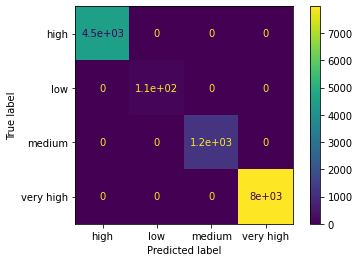

In [ ]:
# Create a display a confusion matrix for your training data.
cm_train = confusion_matrix(y_train, yhat_train)
display(cm_train)

plot_confusion_matrix(dtree, X_train, y_train)

Now, calculate accuracy, precision, recall and F1 scores for the training data. 

Also, because this is multi-class classification, precision, recall and F1 score will report the average across classes by default. We do not want to do that. Do not use averaging and report scores for each category:

In [ ]:
# Calculate accuracy, precision, recall and F1 score for the training data (Google for finding the functions that do that). For precision, recall and F1 score do not use averaging and report scores for each category.


print("Accuracy on training data:", accuracy_score(y_train, yhat_train))

print("Precision on training data:", precision_score(y_train, yhat_train, average=None))

print("Recall on training data:", recall_score(y_train, yhat_train, average=None))

print("F1 score on training data:", f1_score(y_train, yhat_train, average=None))

Accuracy on training data: 1.0
Precision on training data: [1. 1. 1. 1.]
Recall on training data: [1. 1. 1. 1.]
F1 score on training data: [1. 1. 1. 1.]


Now, do the same things for the test data:

array([[1214,   16,  297,  607],
       [   6,   11,   27,    2],
       [ 302,   20,  212,   75],
       [ 669,    4,   90, 3257]])

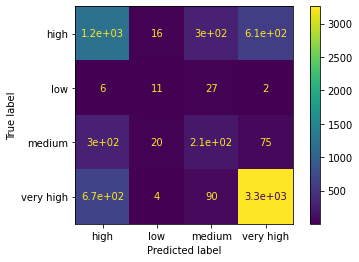

In [ ]:
# Predict labels for test data using our decision tree classifier. Then, create and display a confusion matrix for your test data.
yhat_test = dtree.predict(X_test)
cm_test = confusion_matrix(y_test, yhat_test)
display(cm_test)

plot_confusion_matrix(dtree, X_test, y_test)

In [ ]:
# Calculate accuracy, precision, recall and F1 score for the test data. For precision, recall and F1 score do not use averaging and report scores for each category.

print("Accuracy on test data:", accuracy_score(y_test, yhat_test))

print("Precision on test data:", precision_score(y_test, yhat_test, average=None))

print("Recall on test data:", recall_score(y_test, yhat_test, average=None))

print("F1 score on test data:", f1_score(y_test, yhat_test, average=None))

Accuracy on test data: 0.6893817006902628
Precision on test data: [0.55408489 0.21568627 0.33865815 0.82643999]
Recall on test data: [0.56888472 0.23913043 0.34811166 0.810199  ]
F1 score on test data: [0.56138728 0.22680412 0.34331984 0.81823891]


### Pruning

Experiment with different pre-pruning hyperparameters of the[`DecicionTreeClassifier`](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html) object. Try a number of different settings for `max_depth`, `min_samples_split`, `min_samples_leaf` and `max_leaf_nodes`. Use evaluations for training and test data and the comparisons between them to choose the "best" QuAM.

max_depth hyperparameter tuning

In [ ]:
for md in range(1,20):
  print('max_depth=',md)


  dtree = DecisionTreeClassifier(max_depth=md) # Use arguments to specify hyperparameters
  dtree.fit(X_train, y_train)
  
  yhat_train = dtree.predict(X_train)
  print("Accuracy on training data:", accuracy_score(y_train, yhat_train))
  # print("Precision on training data:", precision_score(y_train, yhat_train, average=None))
  # print("Recall on training data:", recall_score(y_train, yhat_train, average=None))
  # print("F1 score on training data:", f1_score(y_train, yhat_train, average=None))
  # plot_confusion_matrix(dtree, X_train, y_train)

  yhat_test = dtree.predict(X_test)
  print("Accuracy on test data:", accuracy_score(y_test, yhat_test))
  # print("Precision on test data:", precision_score(y_test, yhat_test, average=None))
  # print("Recall on test data:", recall_score(y_test, yhat_test, average=None))
  # print("F1 score on test data:", f1_score(y_test, yhat_test, average=None))
  # plot_confusion_matrix(dtree, X_test, y_test)

  print('\n')


max_depth= 1
Accuracy on training data: 0.6436839820575894
Accuracy on test data: 0.6397415185783522


max_depth= 2
Accuracy on training data: 0.6758066849949356
Accuracy on test data: 0.6745483918343369


max_depth= 3
Accuracy on training data: 0.6758066849949356
Accuracy on test data: 0.6745483918343369


max_depth= 4
Accuracy on training data: 0.6930979597742729
Accuracy on test data: 0.691437802907916


max_depth= 5
Accuracy on training data: 0.7010562870785704
Accuracy on test data: 0.6954031428991041


max_depth= 6
Accuracy on training data: 0.7094487049631023
Accuracy on test data: 0.7028932295491261


max_depth= 7
Accuracy on training data: 0.7307914918246274
Accuracy on test data: 0.7018651784402996


max_depth= 8
Accuracy on training data: 0.7578498046592389
Accuracy on test data: 0.7099427228667939


max_depth= 9
Accuracy on training data: 0.7830270583128346
Accuracy on test data: 0.708180349537377


max_depth= 10
Accuracy on training data: 0.8119664303284618
Accuracy on tes

min_samples_split hyperparameter tuning

In [ ]:
for mss in range(2,20):
  print('min_samples_split=',mss)


  dtree = DecisionTreeClassifier(min_samples_split=mss) # Use arguments to specify hyperparameters
  dtree.fit(X_train, y_train)
  
  yhat_train = dtree.predict(X_train)
  print("Accuracy on training data:", accuracy_score(y_train, yhat_train))
  # print("Precision on training data:", precision_score(y_train, yhat_train, average=None))
  # print("Recall on training data:", recall_score(y_train, yhat_train, average=None))
  # print("F1 score on training data:", f1_score(y_train, yhat_train, average=None))
  # plot_confusion_matrix(dtree, X_train, y_train)

  yhat_test = dtree.predict(X_test)
  print("Accuracy on test data:", accuracy_score(y_test, yhat_test))
  # print("Precision on test data:", precision_score(y_test, yhat_test, average=None))
  # print("Recall on test data:", recall_score(y_test, yhat_test, average=None))
  # print("F1 score on test data:", f1_score(y_test, yhat_test, average=None))
  # plot_confusion_matrix(dtree, X_test, y_test)

  print('\n')


min_samples_split= 2
Accuracy on training data: 1.0
Accuracy on test data: 0.6923189895726245


min_samples_split= 3
Accuracy on training data: 0.9891477354941398
Accuracy on test data: 0.6956968717873403


min_samples_split= 4
Accuracy on training data: 0.9785848647084359
Accuracy on test data: 0.6934939051255691


min_samples_split= 5
Accuracy on training data: 0.9726522934452322
Accuracy on test data: 0.6968717873402849


min_samples_split= 6
Accuracy on training data: 0.9633916944002315
Accuracy on test data: 0.6955500073432223


min_samples_split= 7
Accuracy on training data: 0.9550716249457387
Accuracy on test data: 0.6959906006755765


min_samples_split= 8
Accuracy on training data: 0.9496454926928085
Accuracy on test data: 0.6939344984579233


min_samples_split= 9
Accuracy on training data: 0.9429170886991752
Accuracy on test data: 0.697018651784403


min_samples_split= 10
Accuracy on training data: 0.9348864129648387
Accuracy on test data: 0.6956968717873403


min_samples_spli

min_samples_leaf hyperparameter tuning

In [ ]:
for msl in range(1,30):
  print('min_samples_leaf=',msl)


  dtree = DecisionTreeClassifier(min_samples_leaf=msl) # Use arguments to specify hyperparameters
  dtree.fit(X_train, y_train)
  
  yhat_train = dtree.predict(X_train)
  print("Accuracy on training data:", accuracy_score(y_train, yhat_train))
  # print("Precision on training data:", precision_score(y_train, yhat_train, average=None))
  # print("Recall on training data:", recall_score(y_train, yhat_train, average=None))
  # print("F1 score on training data:", f1_score(y_train, yhat_train, average=None))
  # plot_confusion_matrix(dtree, X_train, y_train)

  yhat_test = dtree.predict(X_test)
  print("Accuracy on test data:", accuracy_score(y_test, yhat_test))
  # print("Precision on test data:", precision_score(y_test, yhat_test, average=None))
  # print("Recall on test data:", recall_score(y_test, yhat_test, average=None))
  # print("F1 score on test data:", f1_score(y_test, yhat_test, average=None))
  # plot_confusion_matrix(dtree, X_test, y_test)

  print('\n')


min_samples_leaf= 1
Accuracy on training data: 1.0
Accuracy on test data: 0.6882067851373183


min_samples_leaf= 2
Accuracy on training data: 0.9561568513963247
Accuracy on test data: 0.6923189895726245


min_samples_leaf= 3
Accuracy on training data: 0.932064824193315
Accuracy on test data: 0.6967249228961668


min_samples_leaf= 4
Accuracy on training data: 0.9102879467515554
Accuracy on test data: 0.6958437362314583


min_samples_leaf= 5
Accuracy on training data: 0.891766748661554
Accuracy on test data: 0.7042150095461889


min_samples_leaf= 6
Accuracy on training data: 0.8754160034727246
Accuracy on test data: 0.7062711117638419


min_samples_leaf= 7
Accuracy on training data: 0.8665171465779192
Accuracy on test data: 0.7096489939785577


min_samples_leaf= 8
Accuracy on training data: 0.8584141224135436
Accuracy on test data: 0.7133206050815097


min_samples_leaf= 9
Accuracy on training data: 0.8490088265084648
Accuracy on test data: 0.7203700983991775


min_samples_leaf= 10
Accura

max_leaf_nodes hyperparameter tuning

In [ ]:
for mln in range(2,20):
  print('max_leaf_nodes=',mln)


  dtree = DecisionTreeClassifier(max_leaf_nodes=mln) # Use arguments to specify hyperparameters
  dtree.fit(X_train, y_train)

  yhat_train = dtree.predict(X_train)
  print("Accuracy on training data:", accuracy_score(y_train, yhat_train))
  # print("Precision on training data:", precision_score(y_train, yhat_train, average=None))
  # print("Recall on training data:", recall_score(y_train, yhat_train, average=None))
  # print("F1 score on training data:", f1_score(y_train, yhat_train, average=None))
  # plot_confusion_matrix(dtree, X_train, y_train)

  yhat_test = dtree.predict(X_test)
  print("Accuracy on test data:", accuracy_score(y_test, yhat_test))
  # print("Precision on test data:", precision_score(y_test, yhat_test, average=None))
  # print("Recall on test data:", recall_score(y_test, yhat_test, average=None))
  # print("F1 score on test data:", f1_score(y_test, yhat_test, average=None))
  # plot_confusion_matrix(dtree, X_test, y_test)

  print('\n')


max_leaf_nodes= 2
Accuracy on training data: 0.6436839820575894
Accuracy on test data: 0.6397415185783522


max_leaf_nodes= 3
Accuracy on training data: 0.6758066849949356
Accuracy on test data: 0.6745483918343369


max_leaf_nodes= 4
Accuracy on training data: 0.6758066849949356
Accuracy on test data: 0.6745483918343369


max_leaf_nodes= 5
Accuracy on training data: 0.6758066849949356
Accuracy on test data: 0.6745483918343369


max_leaf_nodes= 6
Accuracy on training data: 0.6758066849949356
Accuracy on test data: 0.6745483918343369


max_leaf_nodes= 7
Accuracy on training data: 0.692157430183765
Accuracy on test data: 0.6921721251285063


max_leaf_nodes= 8
Accuracy on training data: 0.692157430183765
Accuracy on test data: 0.6921721251285063


max_leaf_nodes= 9
Accuracy on training data: 0.692157430183765
Accuracy on test data: 0.6921721251285063


max_leaf_nodes= 10
Accuracy on training data: 0.692157430183765
Accuracy on test data: 0.6921721251285063


max_leaf_nodes= 11
Accuracy on 

Once we found paratemers that give use the best tree among the ones we tested, we can visualize our final QuAM:

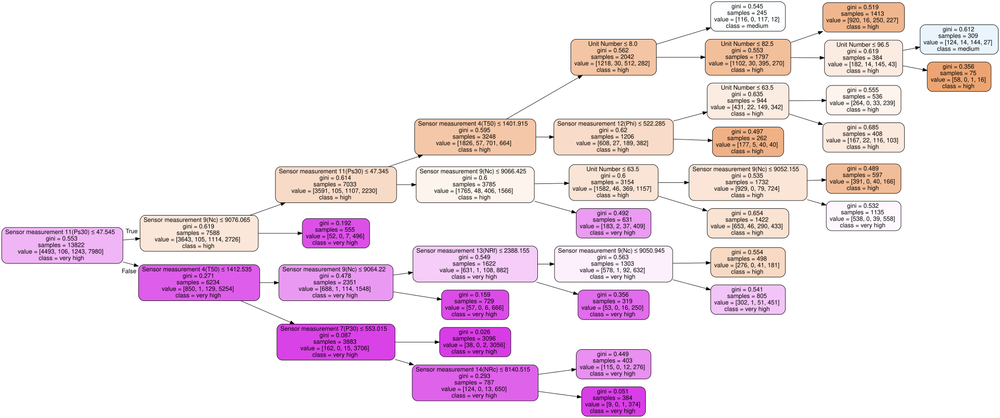

In [ ]:
dot_data = export_graphviz(dtree,
                           out_file=None, 
                           class_names=np.unique(y_train).tolist(),
                           feature_names=feature_names,  
                           filled=True,
                           rounded=True,  
                           special_characters=True,
                           rotate=True)  

display(graphviz.Source(dot_data))

#Finding optimized hyperparameters using gridsearch and randomsearch

In [ ]:
# first check the stability of our model
# the more unstable model is, the more likely will benefit from tuning hyperparameters
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

# set-up the KFold constructor
kfold = KFold(n_splits=5, random_state=42, shuffle=True)

cross_val = cross_val_score(dtree, X_train, y_train, cv=kfold, scoring='accuracy')
print(cross_val.mean())


0.6881055314649995


In [ ]:
# optimize parameters with grid search
# grid search means searching all predefined values in a grid
from sklearn.model_selection import GridSearchCV

# let's now run the grid search
params = {'max_leaf_nodes': list(range(2, 10)), 'min_samples_split': [2, 3, 4, 5, 6],'max_depth': list(range(1,21)),'min_samples_leaf': list(range(1,10))}
grid_search_cv = GridSearchCV(DecisionTreeClassifier(random_state=42), params, verbose=1, cv=3)
grid_search_cv.fit(X_train, y_train)
print("Best params: ", grid_search_cv.best_params_)
print("Best estimators: ", grid_search_cv.best_estimator_)

Fitting 3 folds for each of 7200 candidates, totalling 21600 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 21600 out of 21600 | elapsed: 23.7min finished


Best params:  {'max_depth': 5, 'max_leaf_nodes': 9, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best estimators:  DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=9,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')


In [ ]:
# Let's now run the model again with the optimized parameters
# dtree1 = DecisionTreeClassifier(max_leaf_nodes=99, min_samples_split=2, max_depth=, min_samples_leaf= ,random_state = 0)
# dtree1.fit(X_train, y_train)
# print("Accuracy of train dataset: {:.3f}".format(dtree1.score(X_train, y_train)))
# print("Accuracy of test dataset: {:.3f}".format(dtree1.score(X_test, y_test)))

In [ ]:
#optimize parameters with randomsearch
from sklearn.model_selection import RandomizedSearchCV

#create constructor
random = RandomizedSearchCV(DecisionTreeClassifier(random_state=42), param_distributions=params, verbose=1, cv=3 )
rand_search_cv = random.fit(X_train, y_train)
print("Best params: ", rand_search_cv.best_params_)
print("Best estimators: ", rand_search_cv.best_estimator_)

In [ ]:
# let's now run the model again with the optimized parameters
# Notice that every time you run the randomized optimizer will  generate different results

dtree2 = DecisionTreeClassifier(min_samples_split=6, max_leaf_nodes=89, max_depth=13, min_samples_leaf=11 , random_state = 0)
dtree2.fit(X_train, y_train)
print("Accuracy of train dataset: {:.3f}".format(dtree2.score(X_train, y_train)))
print("Accuracy of test dataset: {:.3f}".format(dtree2.score(X_test, y_test)))